In [13]:
import os
import sys
import numpy as np
import random
import time
import pickle
from tqdm import trange
import math

#model
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from deepxde.nn import activations, initializers
import torch.autograd as autograd

# Evaluation
from scipy.stats import pearsonr, spearmanr
import colorcet as cc

# Module
sys.path.append('./root/') # absolute path to root project folder
import xarray as xr
import Baseline.mre_pinn
from Baseline.mre_pinn.data.dataset import MREExample
from eval_utils import *

# FEM abdomen dataset

In [14]:
fem_abdomen_freqs = [30, 36, 42, 48] 
fem_abdomen_results_path = '../Results/fem_abdomen/'
fem_abdomen_img_path = '../Results/fem_abdomen_images/'
ab_dis_path = '../Data/BIOQIC/downloads/AbdomenMRESimData.mat'
space = 0.002
coords_shape = [174, 136, 20]

In [15]:
x_len = coords_shape[0]
y_len = coords_shape[1]
z_len = coords_shape[2]
xs = np.linspace(0, (x_len-1)*space, x_len)
ys = np.linspace(0, (y_len-1)*space, y_len)
zs = np.linspace(0, (z_len-1)*space, z_len)
X, Y, Z = np.meshgrid(xs, ys, zs, indexing='ij')
meshgrid = np.stack((X, Y, Z), axis=-1)

In [16]:
data, _ = load_mat_file(ab_dis_path)
wave_data = data['disp']
mre_data = data['absG']
wave_data = wave_data.transpose(1, 0, 2, 3, 4)
mre_data = mre_data.transpose(1, 0, 2)


freqs =  [30, 36, 42, 48] 
fem_abdomen_dict = {}
cmap_palette = cc.cm['rainbow_bgyr_10_90_c83']
for i, f in enumerate(freqs):
    u = wave_data[...,i]
    u = u[...,[1, 0, 2]] # original motion encoding direction : y, x, z
    wave_xarray = xr.DataArray(u, dims=['x','y','z', 'component'],\
                               coords={'x': xs, 'y': ys, 'z':zs, 'component': ['x', 'y', 'z']})
    mu_xarray = xr.DataArray(mre_data, dims=['x','y','z'],\
                               coords={'x': xs, 'y': ys, 'z':zs})
    example = MREExample(f, wave_xarray, mu_xarray, None)
    x = example.wave.field.points().reshape(*coords_shape, -1)
    u = example.wave.field.values().reshape(*coords_shape, 3).real
    mu = example.mre.field.values().reshape(*coords_shape).real
    fem_abdomen_dict[f] = {'x':x, 'u': u, 'mu':mu, 'example': example}

In [17]:
def return_new_example(freq):
    i = freqs.index(freq)
    u = wave_data[...,i]
    u = u[...,[1, 0, 2]] # original motion encoding direction : y, x, z
    wave_xarray = xr.DataArray(u, dims=['x','y','z', 'component'],\
                               coords={'x': xs, 'y': ys, 'z':zs, 'component': ['x', 'y', 'z']})
    mu_xarray = xr.DataArray(mre_data, dims=['x','y','z'],\
                               coords={'x': xs, 'y': ys, 'z':zs})
    example = MREExample(freq, wave_xarray, mu_xarray, None)
    return example

## Experiments results

### MREHyper

In [18]:
threshold = 10000

In [25]:
import colorcet as cc
import matplotlib.colors as mcolors
def brighten_and_gamma_correct_colormap(cmap, factor=1, gamma=1.5):
    colors = cmap(np.linspace(0, 1, 256))
    colors[:, :3] = np.clip(colors[:, :3] * factor, 0, 1)  
    colors[:, :3] = np.power(colors[:, :3], gamma)  
    return mcolors.ListedColormap(colors)

bright_cmap = brighten_and_gamma_correct_colormap(cc.cm['cyclic_wrkbw_10_90_c43'], factor=1.5, gamma=1)

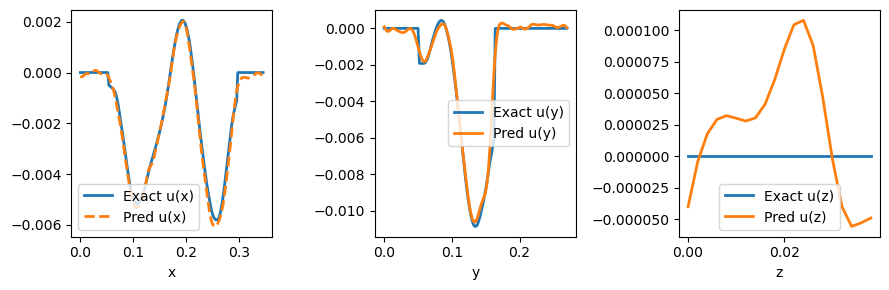

Image saved to ../Results/fem_abdomen_images/GT.png


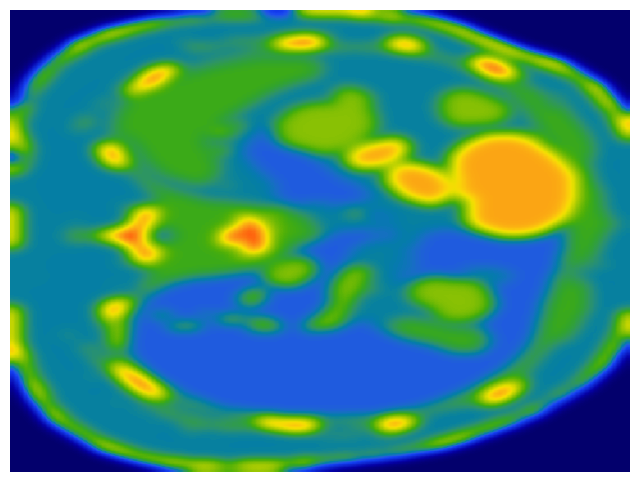

Image saved to ../Results/fem_abdomen_images/MREHyper_preds_30_0.0.png


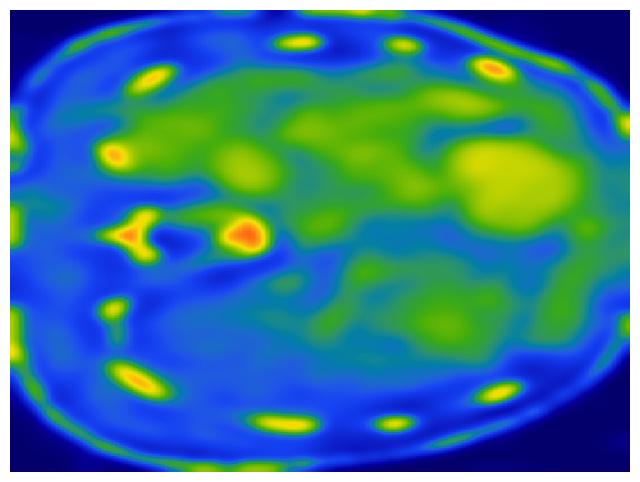

Frequency : 30
mu pearson correlation: 0.7868864678416775


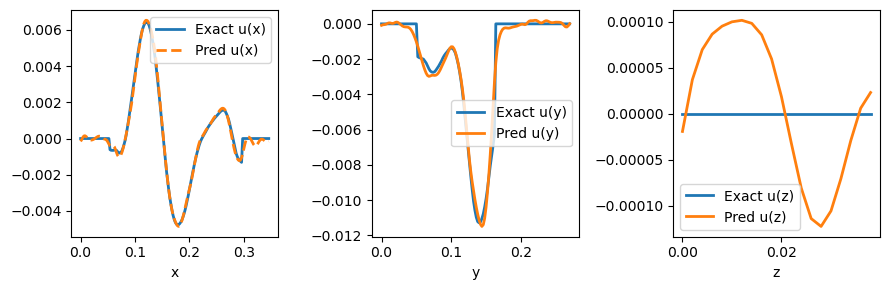

Image saved to ../Results/fem_abdomen_images/GT.png


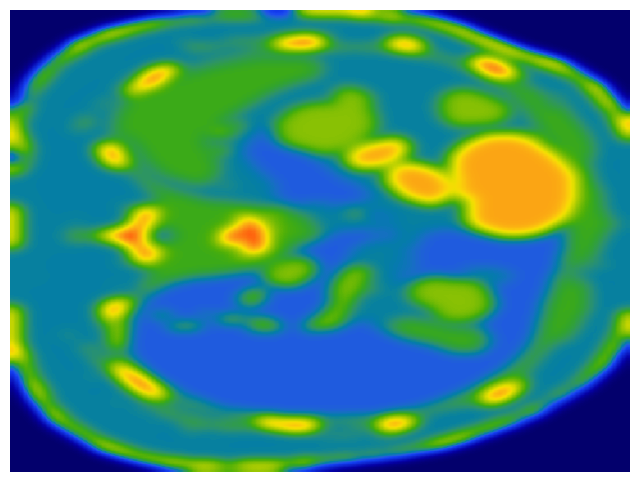

Image saved to ../Results/fem_abdomen_images/MREHyper_preds_36_0.0.png


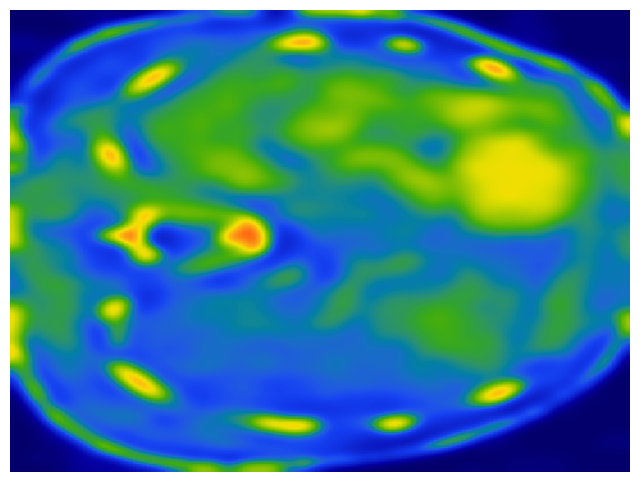

Frequency : 36
mu pearson correlation: 0.80843517405137


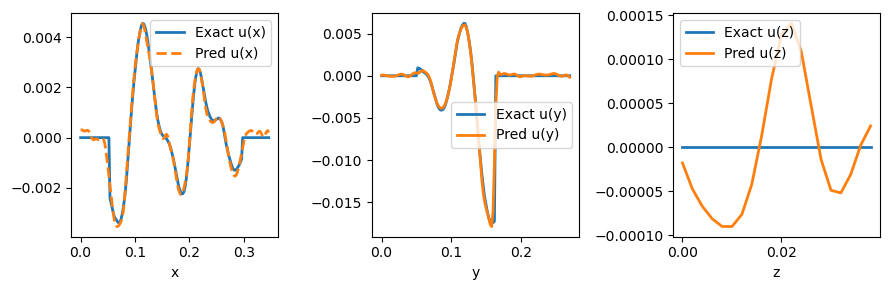

Image saved to ../Results/fem_abdomen_images/GT.png


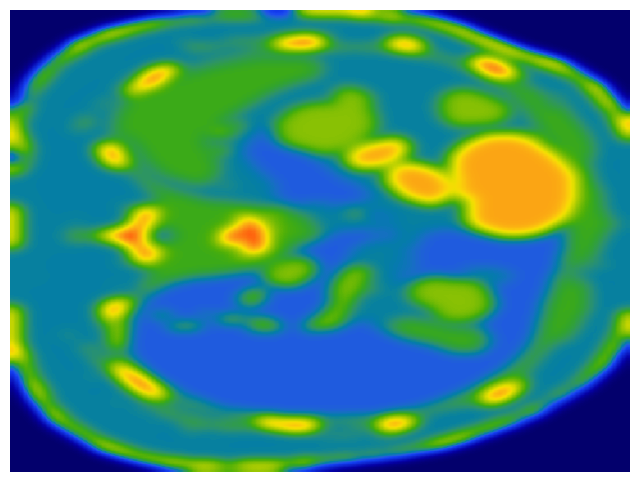

Image saved to ../Results/fem_abdomen_images/MREHyper_preds_42_0.0.png


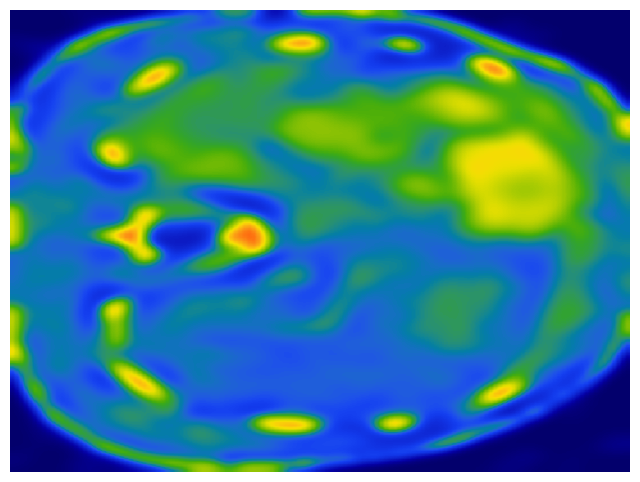

Frequency : 42
mu pearson correlation: 0.8321979670401958


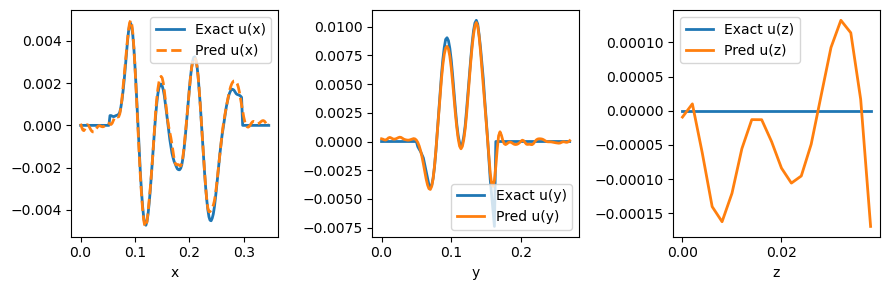

Image saved to ../Results/fem_abdomen_images/GT.png


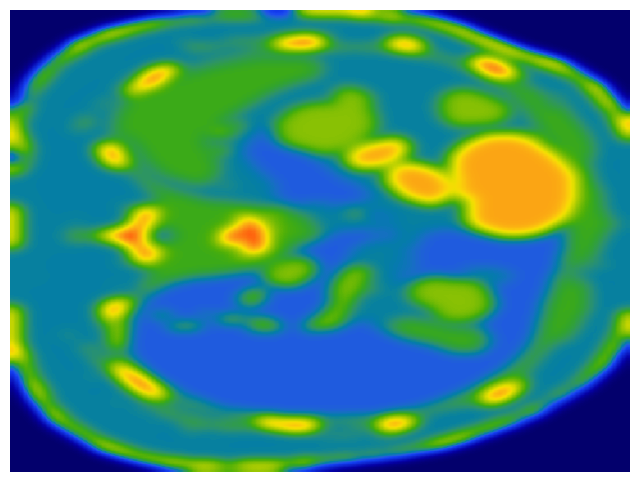

Image saved to ../Results/fem_abdomen_images/MREHyper_preds_48_0.0.png


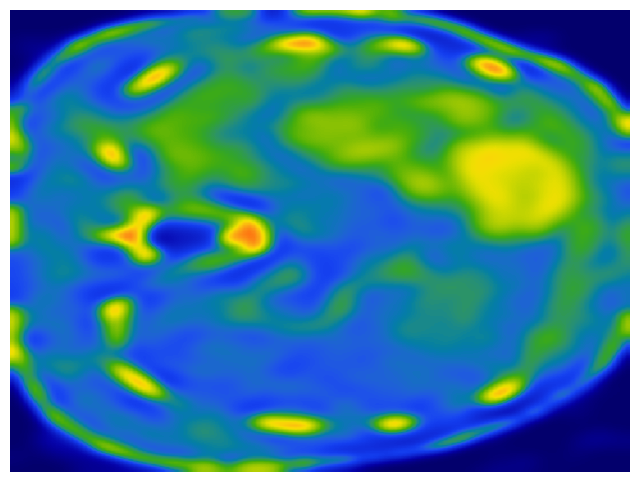

Frequency : 48
mu pearson correlation: 0.8418585998858301


In [9]:
for f in fem_abdomen_freqs:
    name = 'MREHyper_preds_{}_0.0.pkl'.format(f)
    data_file = fem_abdomen_results_path + name
    with open(data_file, 'rb') as file:
        data = pickle.load(file)
        u_pred, u, mu_pred, mu = data
        ex = fem_abdomen_dict[f]['example']
        u_compare_visualization(u_pred.reshape(*coords_shape, 3).detach().cpu().numpy(), u, meshgrid, (5, 5, 5))
        z_fixed = 15 
        mu_pred = mu_pred.reshape(*coords_shape).real.detach().cpu().numpy()
        mu_pred[mu>threshold ]=threshold
        #visualize_mu_slice(u[...,0], fixed_axis='z', fixed_index=z_fixed, cmap=bright_cmap , vmax=0.02, vmin=-0.02, log_scale=False)#, save_path=fem_abdomen_img_path+'wave_{}.png'.format(f))
        #visualize_overlay(np.minimum(mu.real, threshold), np.minimum(mu.real, threshold), fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=0, cmap_pred=cmap_palette, save_path=fem_abdomen_img_path+'GT.png')
        visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'MREHyper_preds_{}_0.0.png'.format(f))
        print('Frequency : {}'.format(f))
        print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### MRE-PINN

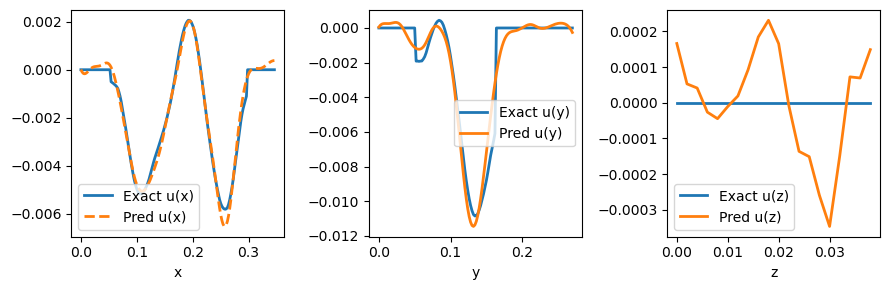

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_30_0.0.png


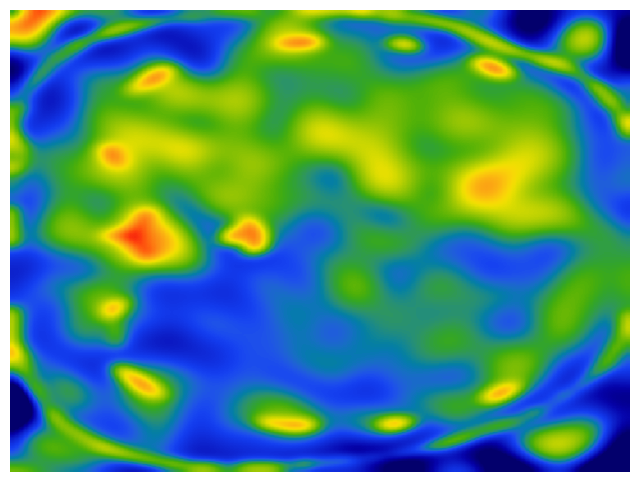

Frequency : 30
mu pearson correlation: 0.5461621780676624


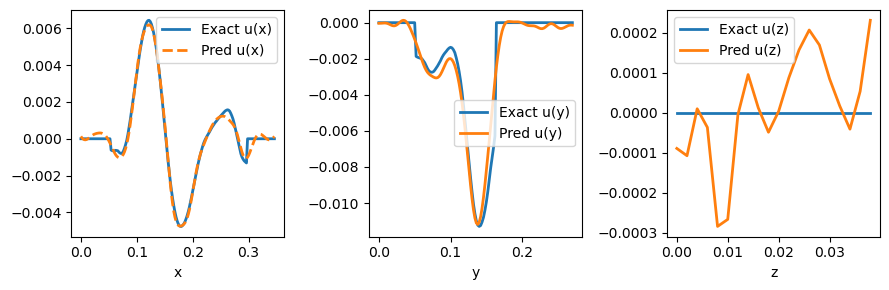

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_0.0.png


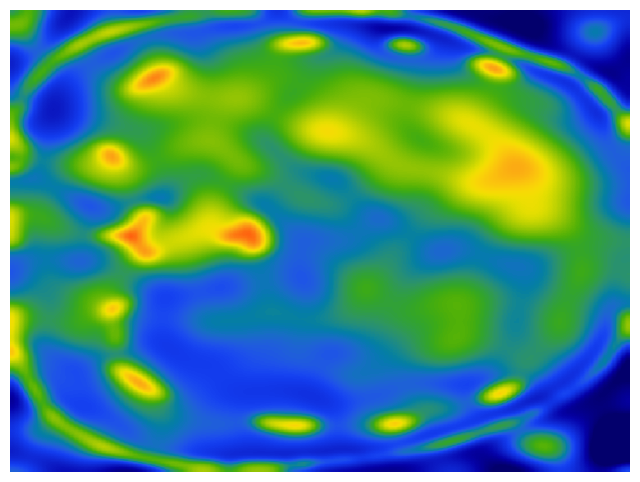

Frequency : 36
mu pearson correlation: 0.6846513646976503


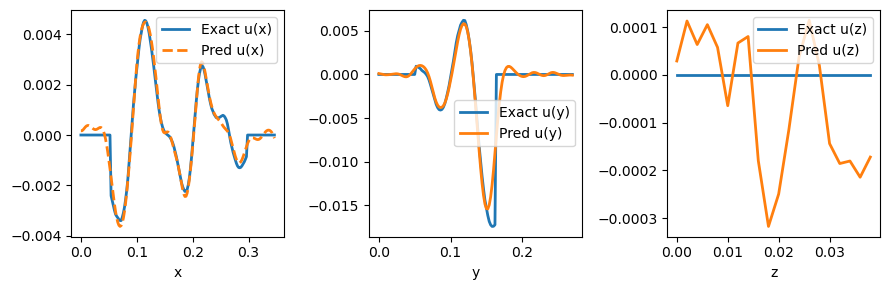

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_42_0.0.png


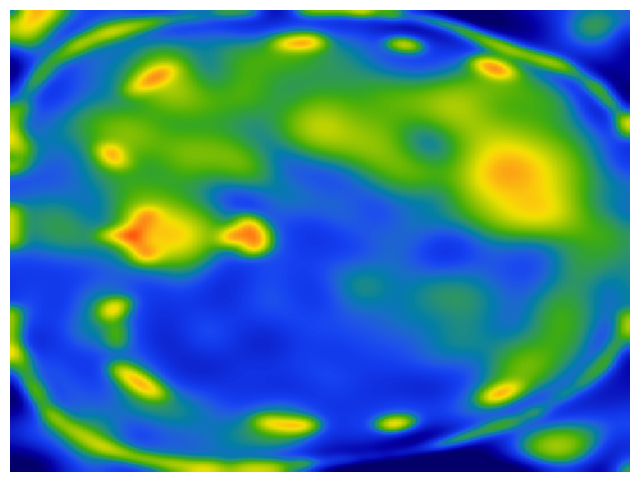

Frequency : 42
mu pearson correlation: 0.7001138765922095


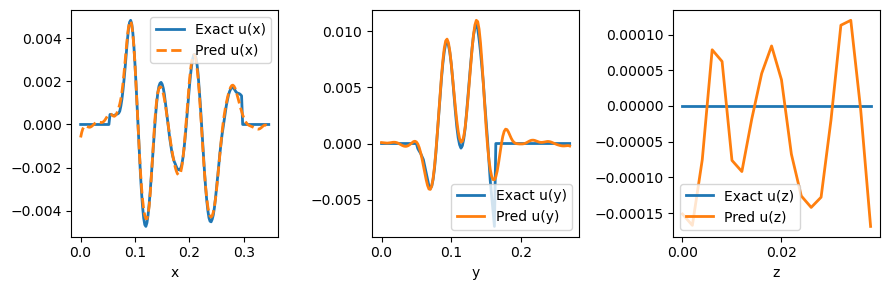

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_48_0.0.png


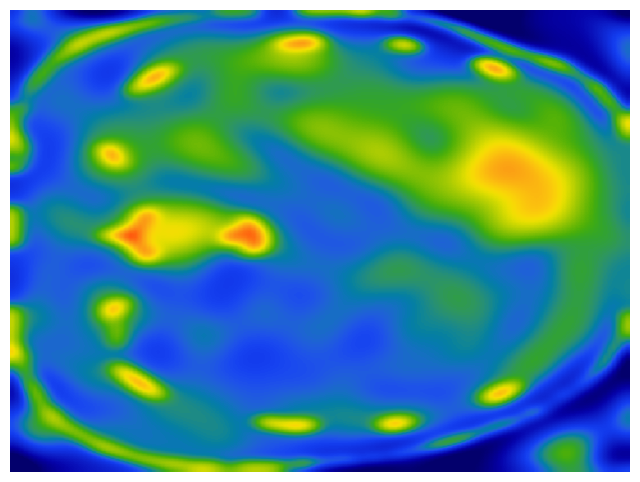

Frequency : 48
mu pearson correlation: 0.7719317767494097


In [9]:
for f in fem_abdomen_freqs:
    name = 'mrepinn_preds_{}.pkl'.format(f)
    data_file = fem_abdomen_results_path + name
    with open(data_file, 'rb') as file:
        data = pickle.load(file)
        u_pred, u, mu_pred, mu = data
        ex = fem_abdomen_dict[f]['example']
        u_compare_visualization(u_pred.reshape(*coords_shape, 3).detach().cpu().numpy(), u, meshgrid, (5, 5, 5))
        z_fixed = 15  
        mu_pred = mu_pred.reshape(*coords_shape).real.detach().cpu().numpy()
        mu_pred[mu>threshold ]=threshold
        visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=-0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'mrepinn_preds_{}_0.0.png'.format(f))
        print('Frequency : {}'.format(f))
        print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### AHI

In [30]:
for k, v in fem_abdomen_dict.items():
    example = v['example']
    Baseline.mre_pinn.baseline.eval_ahi_baseline(example, frequency=k, despeckle=True)

Evaluating direct baseline
Evaluating direct baseline
Evaluating direct baseline
Evaluating direct baseline


Image saved to ../Results/fem_abdomen_images/AHI_preds_30_0.0.png


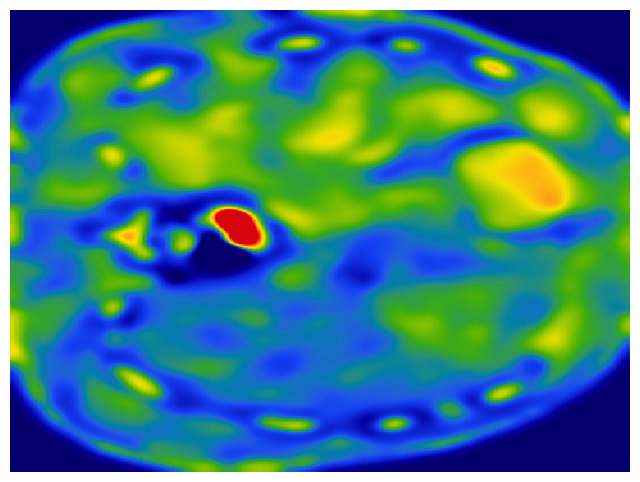

Frequency : 30
mu pearson correlation: 0.5712415596834454
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_0.0.png


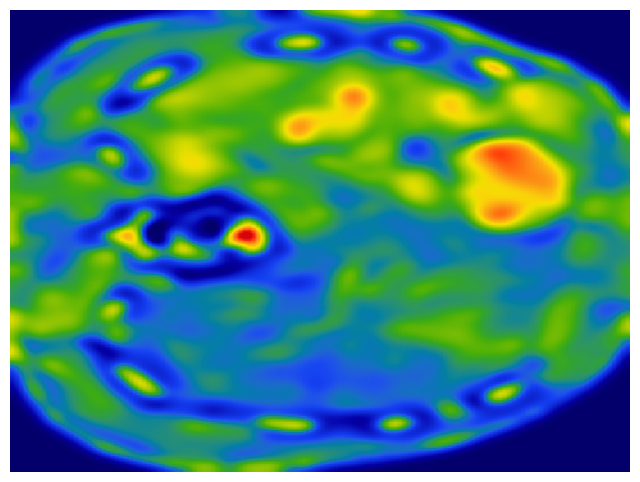

Frequency : 36
mu pearson correlation: 0.6656209788746621
Image saved to ../Results/fem_abdomen_images/AHI_preds_42_0.0.png


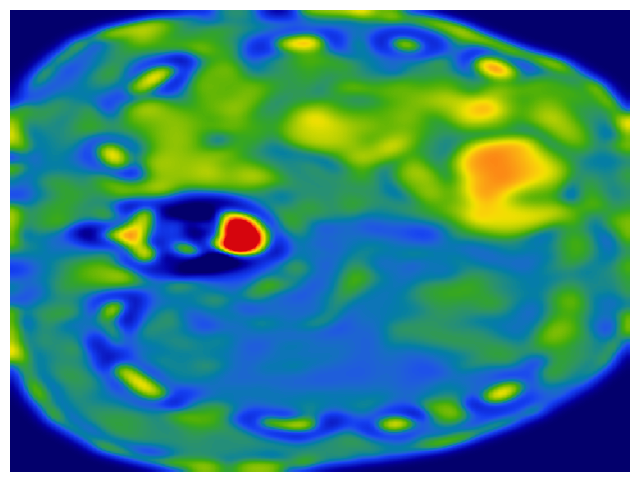

Frequency : 42
mu pearson correlation: 0.6617060590626576
Image saved to ../Results/fem_abdomen_images/AHI_preds_48_0.0.png


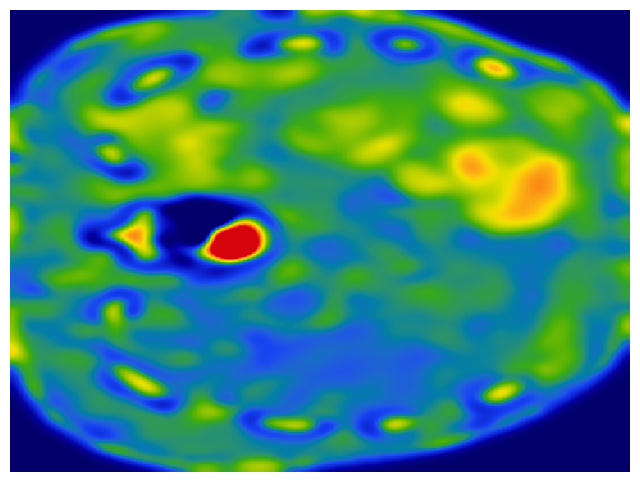

Frequency : 48
mu pearson correlation: 0.6791317300725225


In [11]:
for k, v in fem_abdomen_dict.items():
    example = v['example']
    mu_pred = example['direct'].real.values
    mu = v['mu']
    z_fixed = 15
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'AHI_preds_{}_0.0.png'.format(k))
    print('Frequency : {}'.format(k))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, example.mre,(mu<threshold)).values))

### Fem-Helmholtz

In [31]:
hetero=False
for k, v in fem_abdomen_dict.items():
    example = v['example']
    Baseline.mre_pinn.baseline.eval_fem_baseline(
        example,
        k,
        u_elem_type='CG-3',
        mu_elem_type='DG-1',
        savgol_filter=False,
        hetero=hetero)

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:20<00:00,  1.00s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:20<00:00,  1.01s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:20<00:00,  1.00s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:20<00:00,  1.00s/it]


Image saved to ../Results/fem_abdomen_images/fem_hh_preds_30_0.0.png


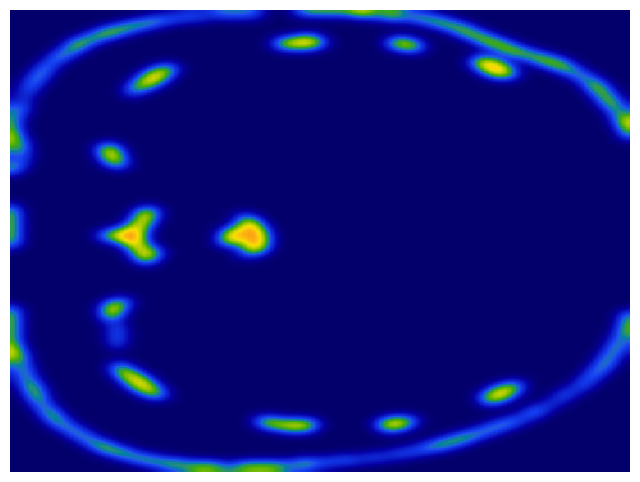

Frequency : 30
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_0.0.png


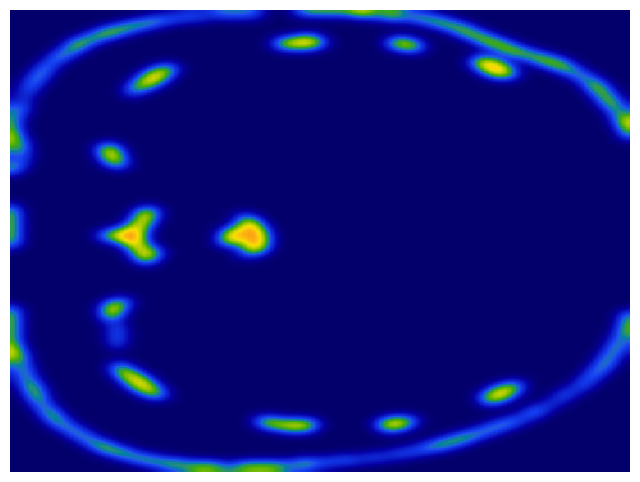

Frequency : 36
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_42_0.0.png


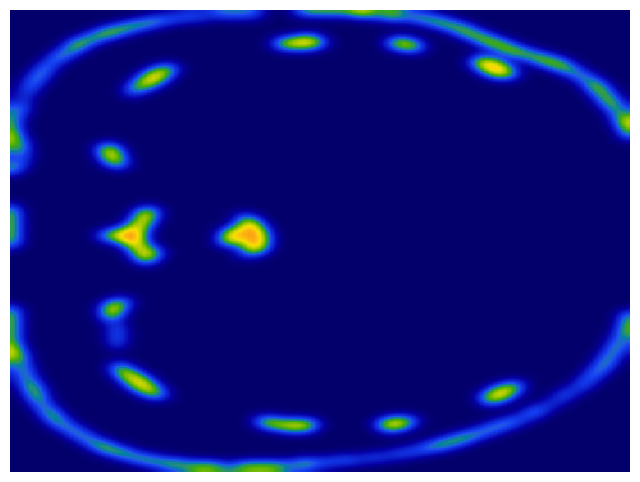

Frequency : 42
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_48_0.0.png


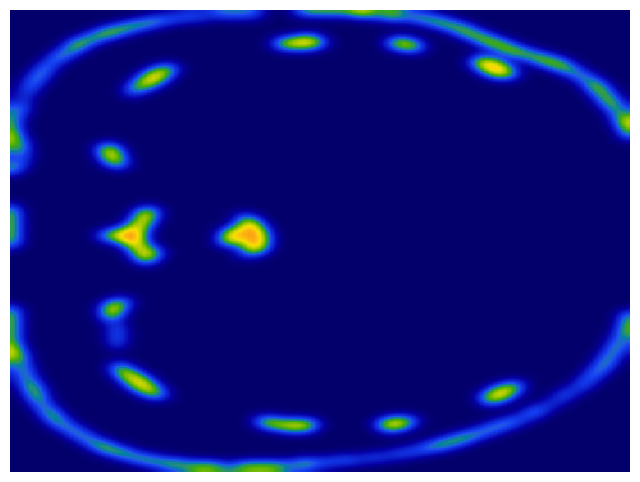

Frequency : 48
mu pearson correlation: nan


In [13]:
for k, v in fem_abdomen_dict.items():
    example = v['example']
    mu_pred = example['fem'].real.values
    mu = v['mu']
    z_fixed = 15
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'fem_hh_preds_{}_0.0.png'.format(k))
    print('Frequency : {}'.format(k))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, example.mre,(mu<threshold)).values))

### Fem-Heterogenous

In [14]:
hetero=True
for k, v in fem_abdomen_dict.items():
    example = v['example']
    Baseline.mre_pinn.baseline.eval_fem_baseline(
        example,
        k,
        u_elem_type='CG-3',
        mu_elem_type='DG-1',
        savgol_filter=False,
        hetero=hetero)

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]
Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]


Image saved to ../Results/fem_abdomen_images/fem_het_preds_30_0.0.png


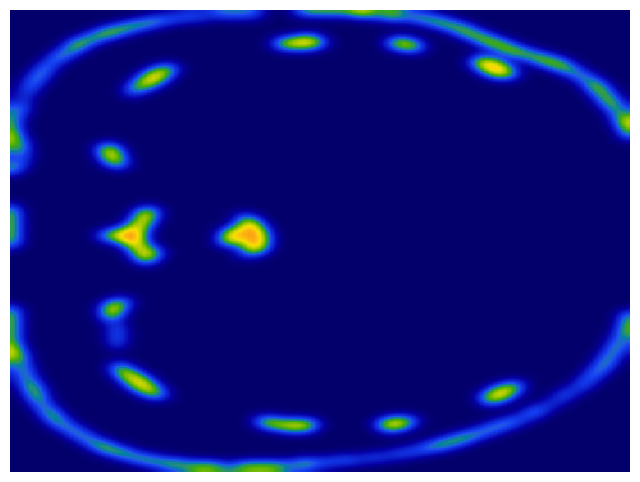

Frequency : 30
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_0.0.png


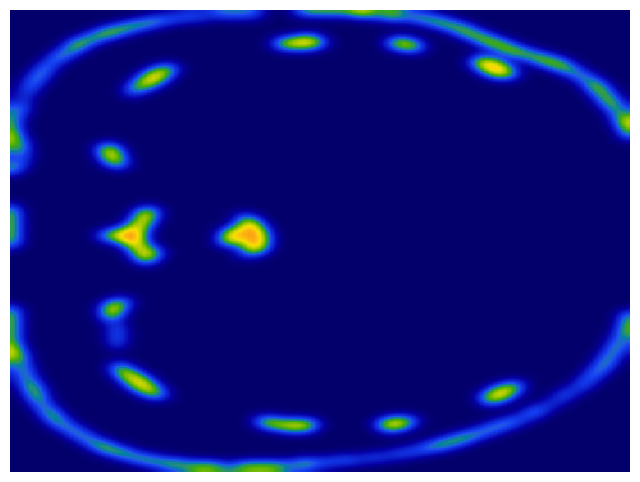

Frequency : 36
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_het_preds_42_0.0.png


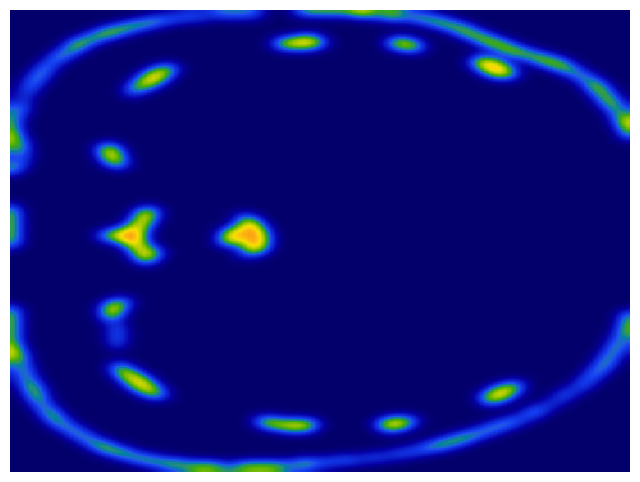

Frequency : 42
mu pearson correlation: nan
Image saved to ../Results/fem_abdomen_images/fem_het_preds_48_0.0.png


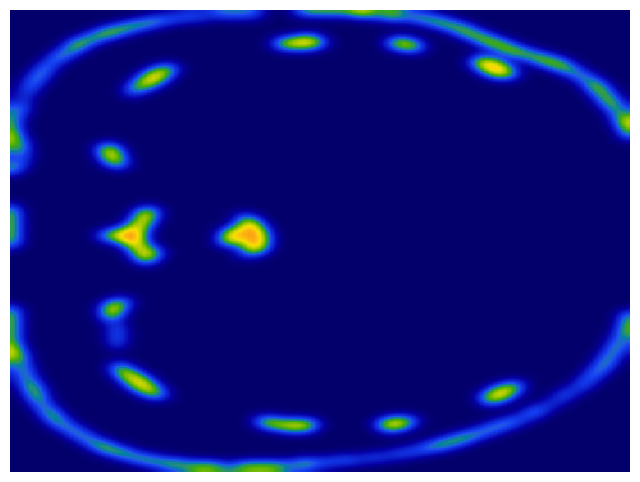

Frequency : 48
mu pearson correlation: nan


In [15]:
for k, v in fem_abdomen_dict.items():
    example = v['example']
    mu_pred = example['fem'].real.values
    mu = v['mu']
    z_fixed = 15
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'fem_het_preds_{}_0.0.png'.format(k))
    print('Frequency : {}'.format(k))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, example.mre,(mu<threshold)).values))

## Noise Experiment results

In [23]:
noise_ratios = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
f = 36

### MREHyper


---------------    noise ratio : 1e-05   -----------------



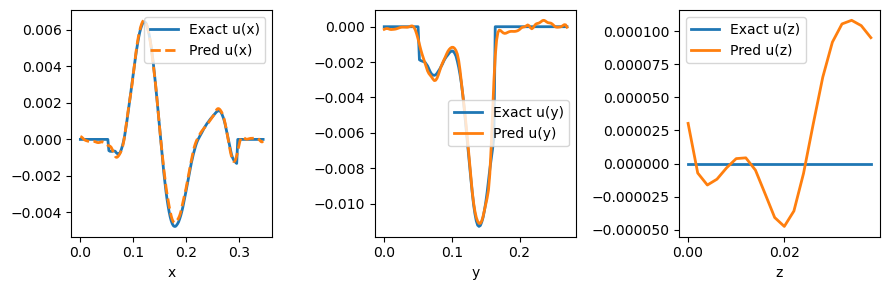

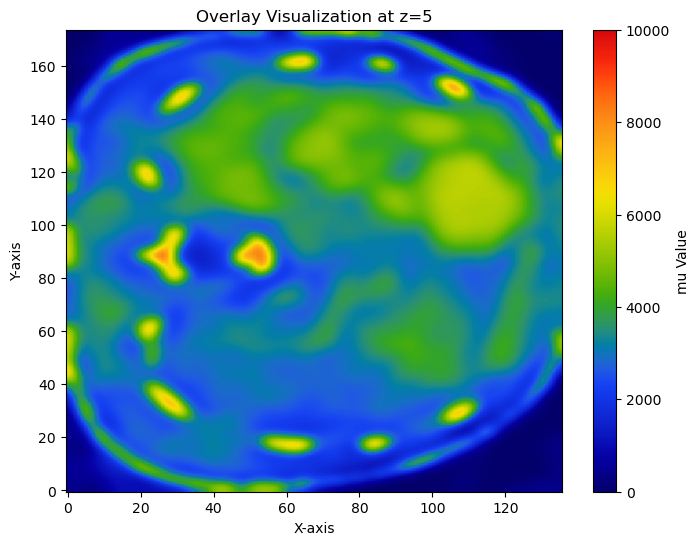

Noise ratio : 1e-05
Frequency : 36
mu pearson correlation: 0.7947109351404543

---------------    noise ratio : 0.0001   -----------------



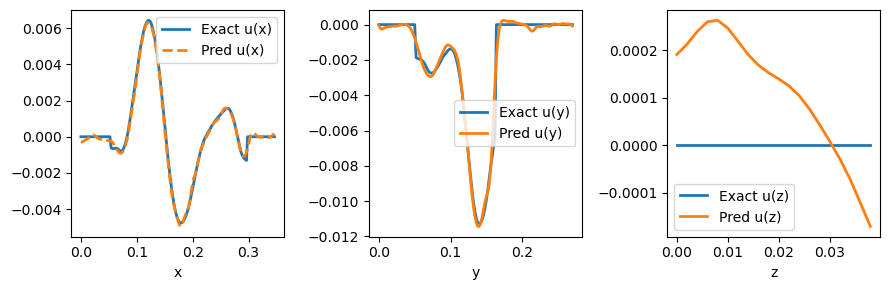

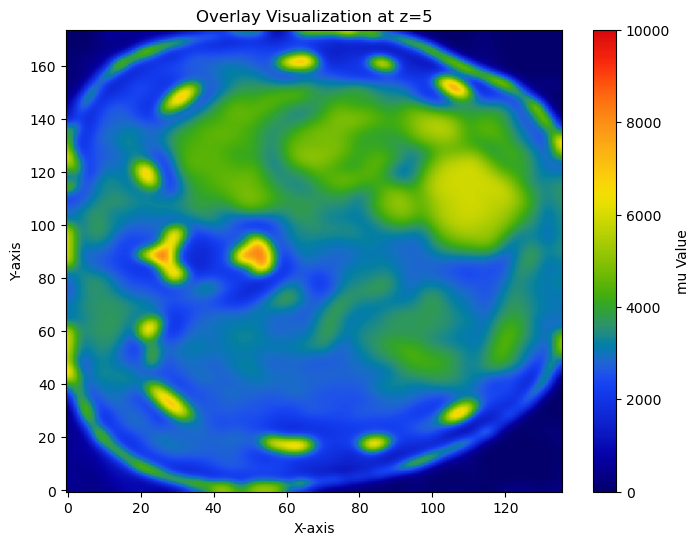

Noise ratio : 0.0001
Frequency : 36
mu pearson correlation: 0.7978962772718945

---------------    noise ratio : 0.001   -----------------



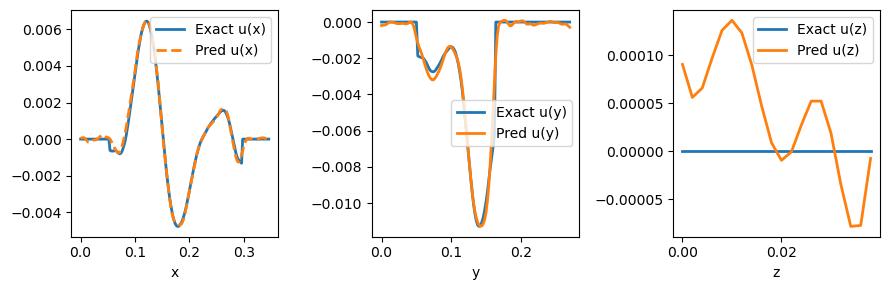

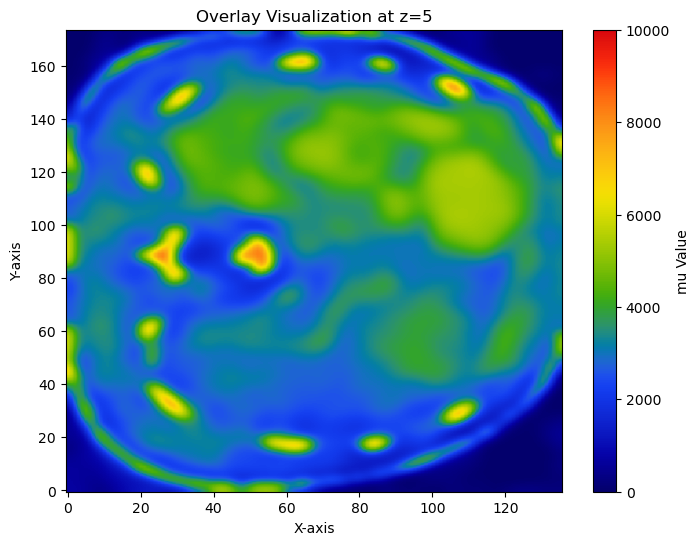

Noise ratio : 0.001
Frequency : 36
mu pearson correlation: 0.7946838379428022

---------------    noise ratio : 0.01   -----------------



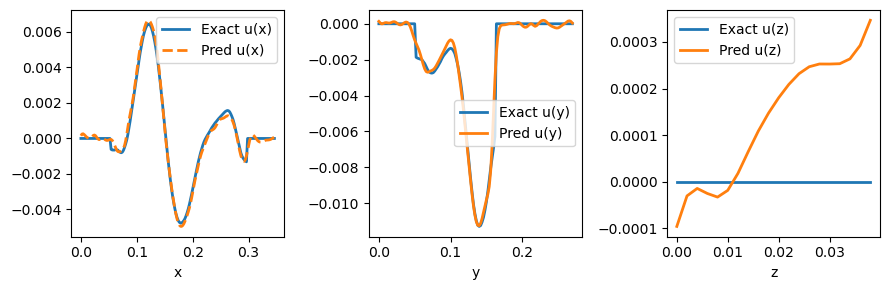

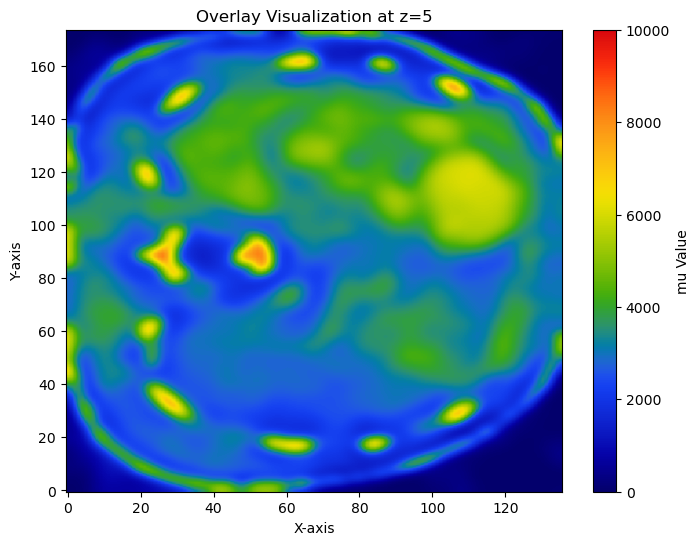

Noise ratio : 0.01
Frequency : 36
mu pearson correlation: 0.7979378742886277

---------------    noise ratio : 0.1   -----------------



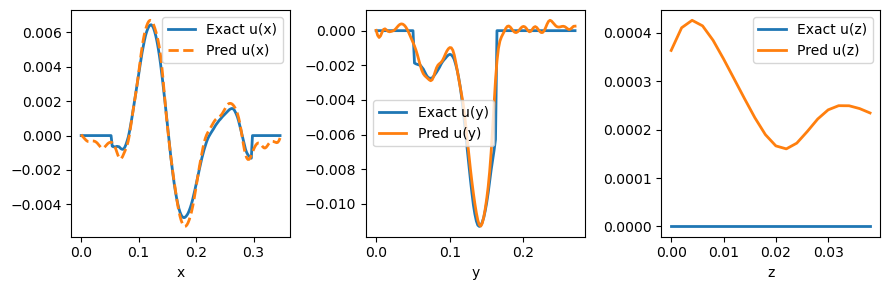

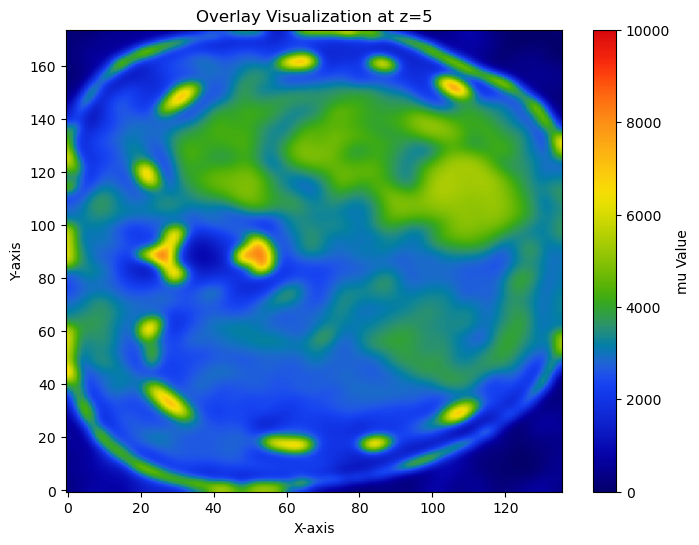

Noise ratio : 0.1
Frequency : 36
mu pearson correlation: 0.7771744986672087


In [32]:
for noise in noise_ratios:
    data_file = fem_abdomen_results_path+'MREHyper_preds_{}_{}.pkl'.format(f, noise)
    print('\n---------------    noise ratio : {}   -----------------\n'.format(noise))
    with open(data_file, 'rb') as file:
        data = pickle.load(file)
        u_pred, u, mu_pred, mu = data
        #visualize_mu_slice(u[...,0], fixed_axis='z', fixed_index=z_fixed, cmap=bright_cmap, vmin=-0.02, vmax=0.02, log_scale=False, save_path=fem_abdomen_img_path+'wave_{}_{}.png'.format(f, noise))
        u = fem_abdomen_dict[f]['u']
        u_compare_visualization(u_pred.reshape(*coords_shape, 3).detach().cpu().numpy(), u, meshgrid, (5, 5, 5))
        z_fixed = 15 
        mu_pred = mu_pred.reshape(*coords_shape).real.detach().cpu().numpy()
        mu_pred[mu>threshold ]=threshold
        visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=-0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'MREHyper_preds_{}_{}.png'.format(f, noise))
        print('Noise ratio : {}'.format(noise))
        print('Frequency : {}'.format(f))
        print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### MRE-PINN


---------------    noise ratio : 1e-05   -----------------



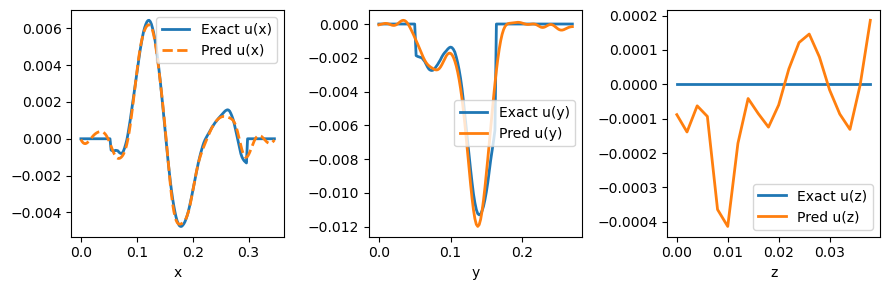

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_1e-05.png


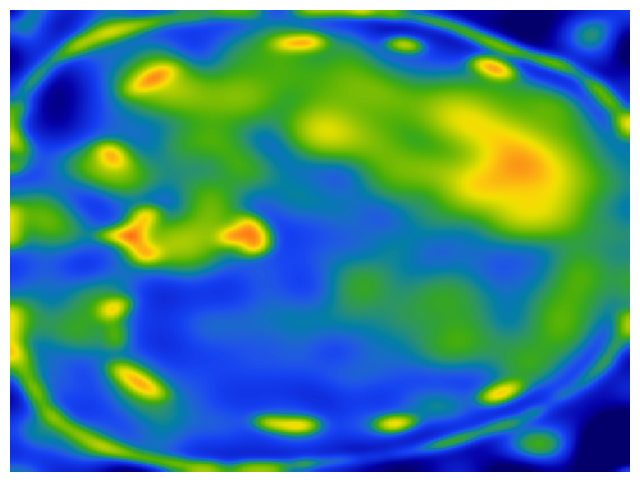

Noise ratio : 1e-05
Frequency : 36
mu pearson correlation: 0.6533002196364307

---------------    noise ratio : 0.0001   -----------------



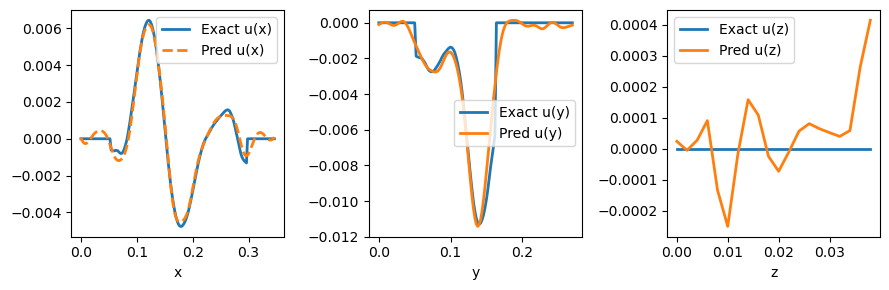

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_0.0001.png


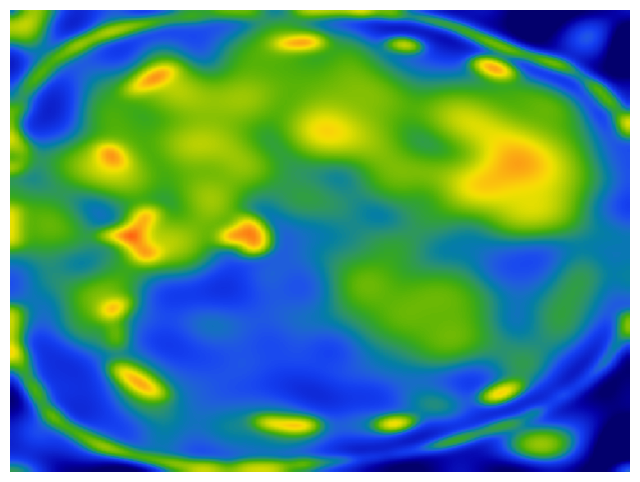

Noise ratio : 0.0001
Frequency : 36
mu pearson correlation: 0.6325292834585351

---------------    noise ratio : 0.001   -----------------



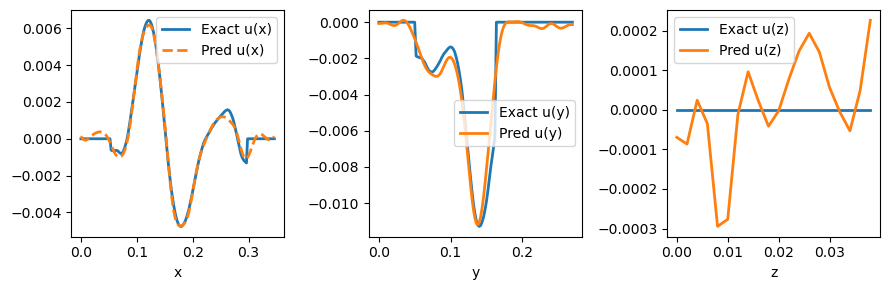

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_0.001.png


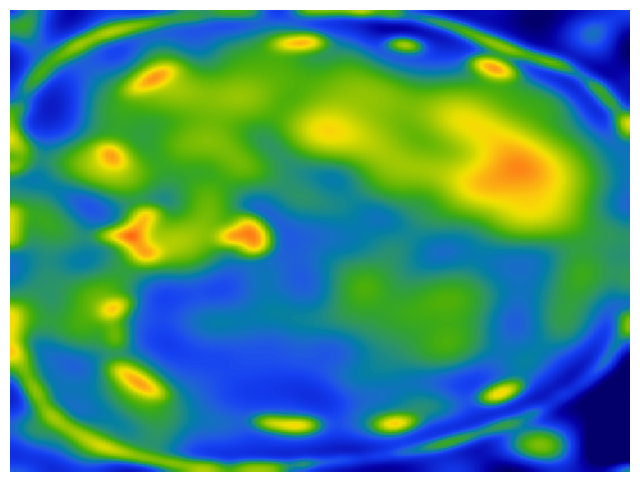

Noise ratio : 0.001
Frequency : 36
mu pearson correlation: 0.6767969993714812

---------------    noise ratio : 0.01   -----------------



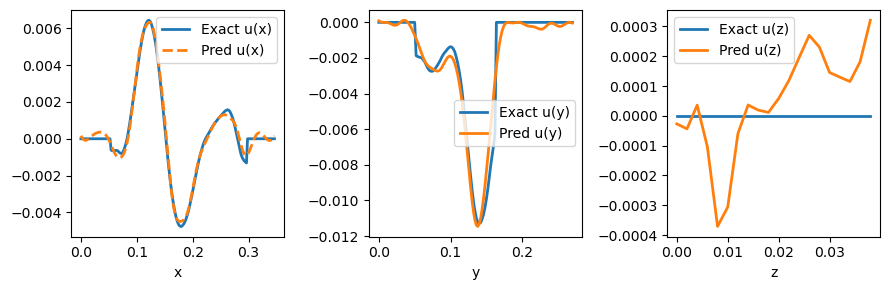

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_0.01.png


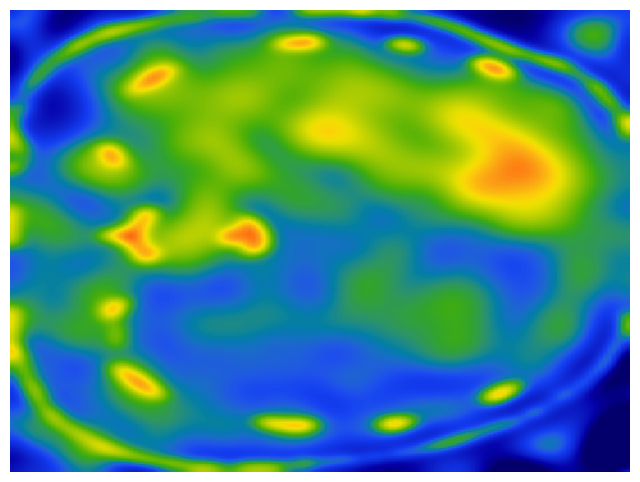

Noise ratio : 0.01
Frequency : 36
mu pearson correlation: 0.6891324336175783

---------------    noise ratio : 0.1   -----------------



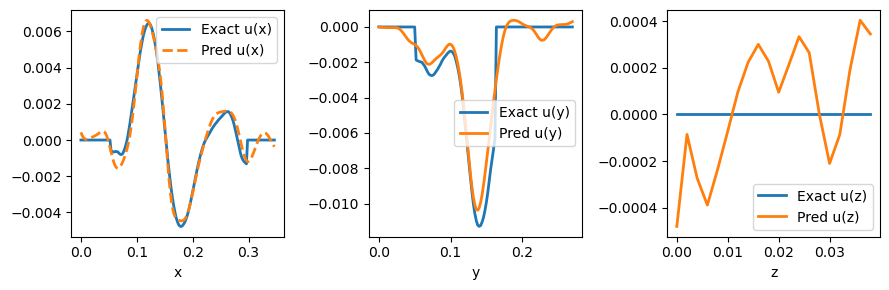

Image saved to ../Results/fem_abdomen_images/mrepinn_preds_36_0.1.png


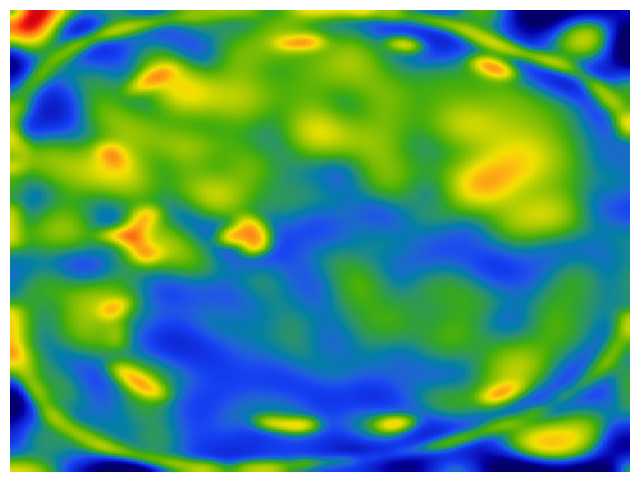

Noise ratio : 0.1
Frequency : 36
mu pearson correlation: 0.4864959941167751


In [23]:
for noise in noise_ratios:#noise_ratios:
    data_file = fem_abdomen_results_path+'mrepinn_preds_{}_{}.pkl'.format(f, noise)
    print('\n---------------    noise ratio : {}   -----------------\n'.format(noise))
    with open(data_file, 'rb') as file:
        data = pickle.load(file)
        u_pred, _, mu_pred, mu = data
        u = fem_abdomen_dict[f]['u']
        u_compare_visualization(u_pred.reshape(*coords_shape, 3).detach().cpu().numpy(), u, meshgrid, (5, 5, 5))
        z_fixed = 15 
        mu_pred = mu_pred.reshape(*coords_shape).real.detach().cpu().numpy()
        mu_pred[mu>threshold ]=threshold
        visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, alpha=1, blur_sigma=2, vmax=threshold, vmin=-0, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'mrepinn_preds_{}_{}.png'.format(f, noise))
        print('Noise ratio : {}'.format(noise))
        print('Frequency : {}'.format(f))
        print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### AHI


---------------    noise ratio : 1e-05   -----------------

Evaluating direct baseline
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_1e-05.png


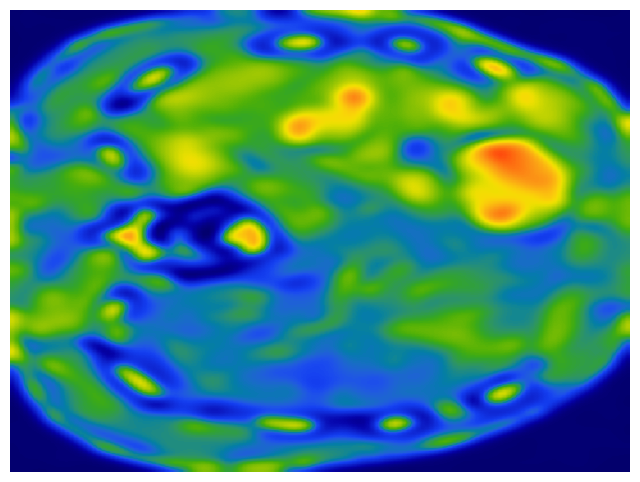

Noise ratio : 1e-05
Frequency : 36
mu pearson correlation: 0.6815441963474734

---------------    noise ratio : 0.0001   -----------------

Evaluating direct baseline
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_0.0001.png


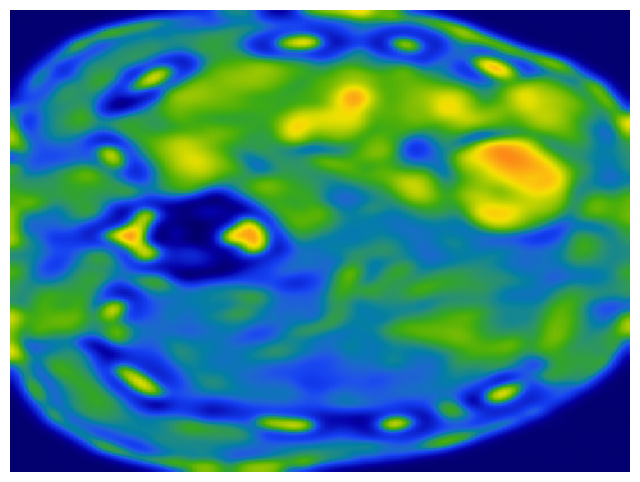

Noise ratio : 0.0001
Frequency : 36
mu pearson correlation: 0.6450315318367611

---------------    noise ratio : 0.001   -----------------

Evaluating direct baseline
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_0.001.png


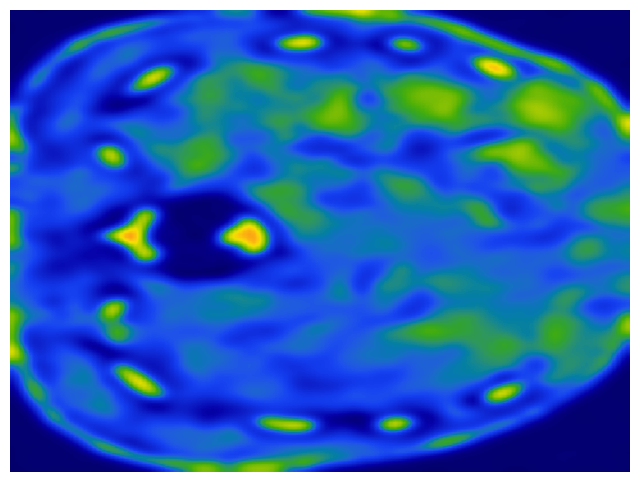

Noise ratio : 0.001
Frequency : 36
mu pearson correlation: 0.44776814004614823

---------------    noise ratio : 0.01   -----------------

Evaluating direct baseline
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_0.01.png


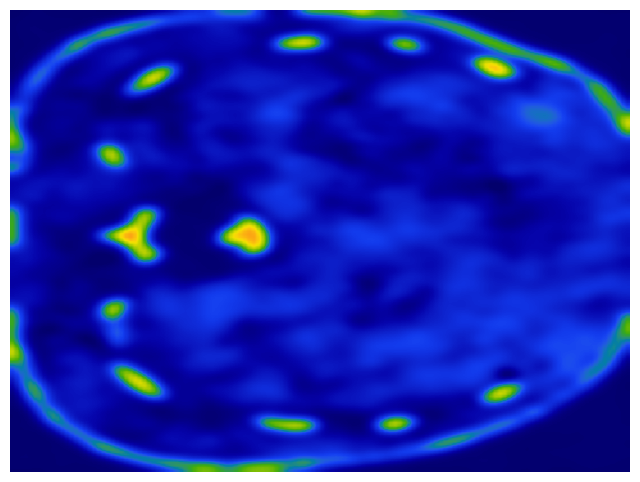

Noise ratio : 0.01
Frequency : 36
mu pearson correlation: 0.22703170653143243

---------------    noise ratio : 0.1   -----------------

Evaluating direct baseline
Image saved to ../Results/fem_abdomen_images/AHI_preds_36_0.1.png


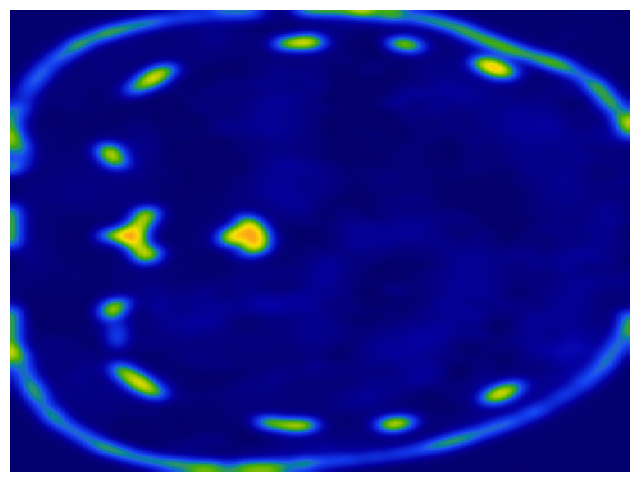

Noise ratio : 0.1
Frequency : 36
mu pearson correlation: 0.15186426189541935


In [19]:
for noise in noise_ratios:
    print('\n---------------    noise ratio : {}   -----------------\n'.format(noise))
    example = return_new_example(f)
    example.add_gaussian_noise(noise)
    Baseline.mre_pinn.baseline.eval_ahi_baseline(example, frequency=f, despeckle=True)
    mu_pred = example['direct'].real.values
    mu = fem_abdomen_dict[f]['mu']
    z_fixed = 15 
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    ex = fem_abdomen_dict[f]['example']
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, vmax=threshold, vmin=0, alpha=1,blur_sigma=2, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'AHI_preds_{}_{}.png'.format(f, noise))
    print('Noise ratio : {}'.format(noise))
    print('Frequency : {}'.format(f))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### FEM-Helmholtz


---------------    noise ratio : 1e-05   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.10s/it]
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_1e-05.png


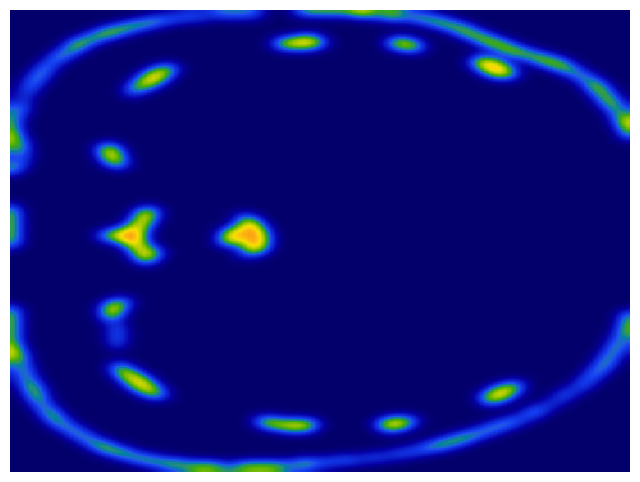

Noise ratio : 1e-05
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.0001   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_0.0001.png


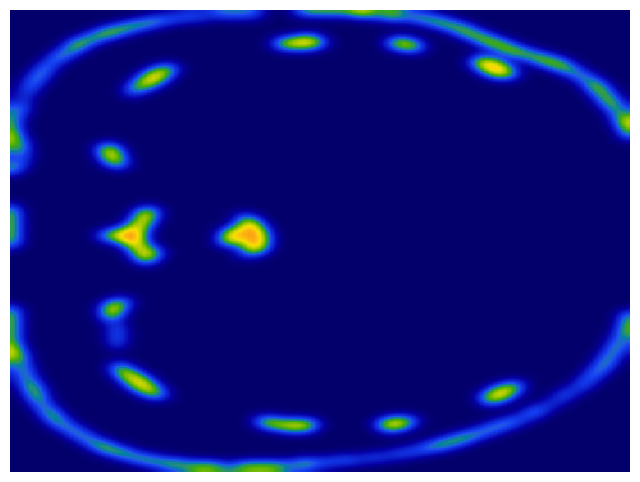

Noise ratio : 0.0001
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.001   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:21<00:00,  1.06s/it]
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_0.001.png


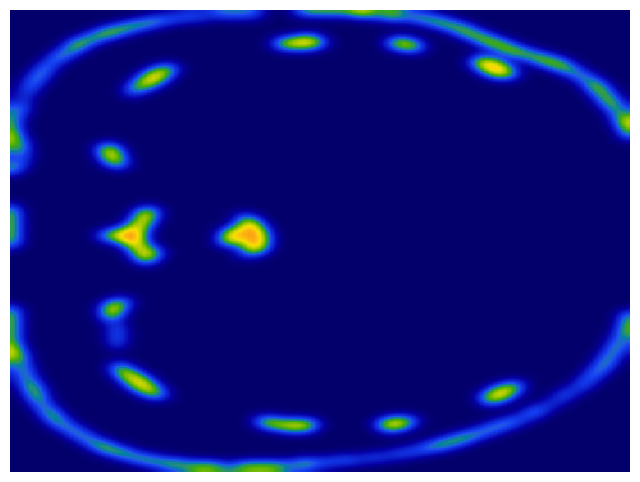

Noise ratio : 0.001
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.01   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:21<00:00,  1.06s/it]
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_0.01.png


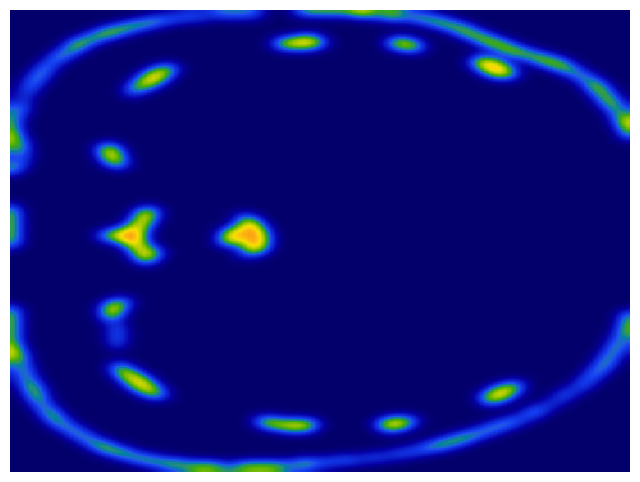

Noise ratio : 0.01
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.1   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:21<00:00,  1.05s/it]
Image saved to ../Results/fem_abdomen_images/fem_hh_preds_36_0.1.png


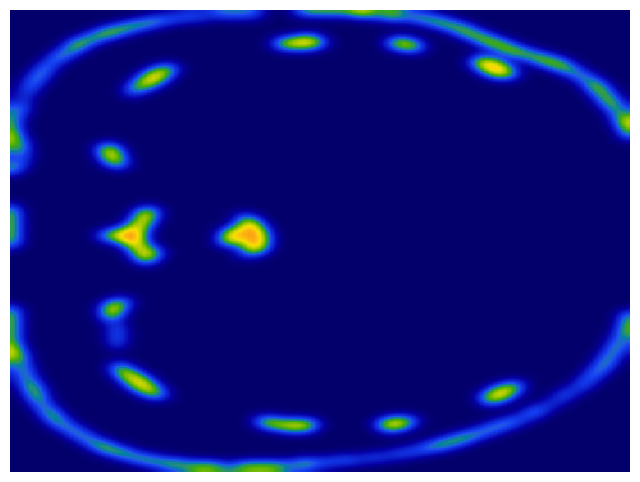

Noise ratio : 0.1
Frequency : 36
mu pearson correlation: nan


In [20]:
hetero=False
for noise in noise_ratios:
    print('\n---------------    noise ratio : {}   -----------------\n'.format(noise))
    example = return_new_example(f)
    example.add_gaussian_noise(noise)
    Baseline.mre_pinn.baseline.eval_fem_baseline(example, f, u_elem_type='CG-3',mu_elem_type='DG-1',savgol_filter=False,hetero=hetero)
    mu_pred = example['fem'].real.values
    mu = fem_abdomen_dict[f]['mu']
    z_fixed = 15 
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    ex = fem_abdomen_dict[f]['example']
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, vmax=threshold, vmin=0, alpha=1,blur_sigma=2, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'fem_hh_preds_{}_{}.png'.format(f, noise))
    print('Noise ratio : {}'.format(noise))
    print('Frequency : {}'.format(f))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))

### FEM-Heterogenous


---------------    noise ratio : 1e-05   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_1e-05.png


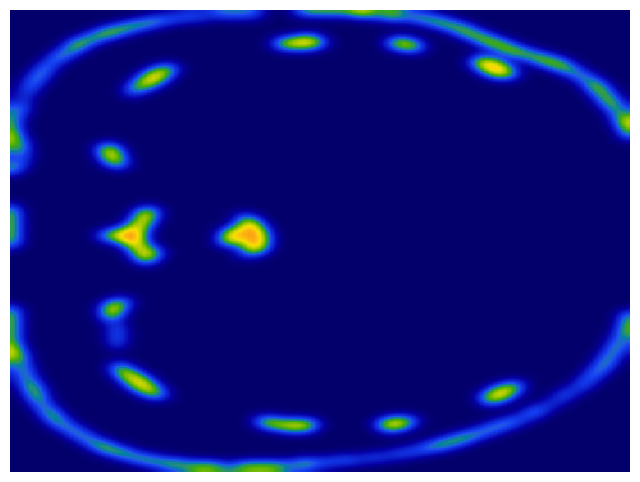

Noise ratio : 1e-05
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.0001   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_0.0001.png


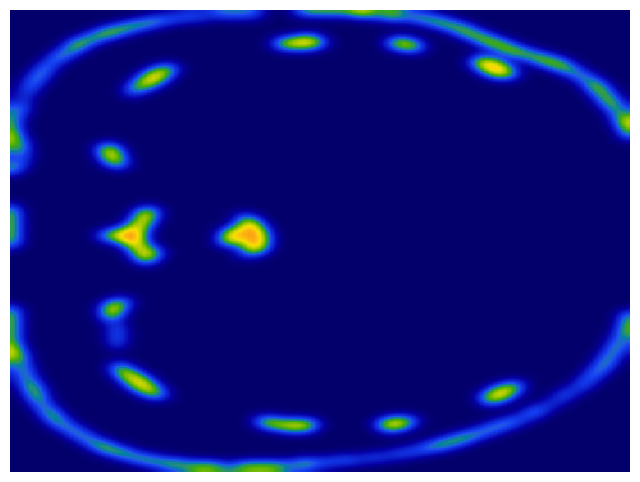

Noise ratio : 0.0001
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.001   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_0.001.png


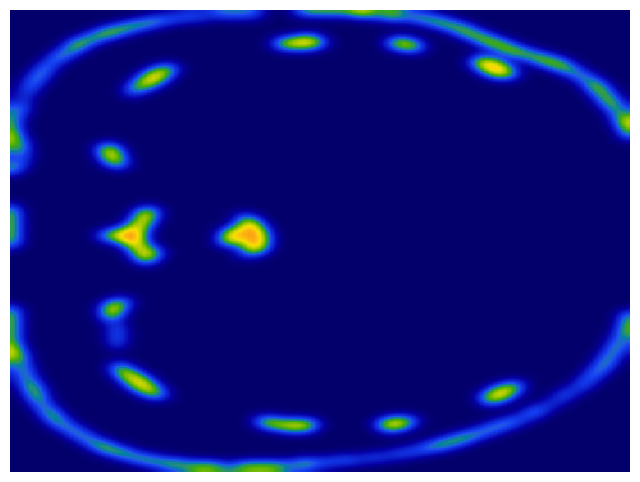

Noise ratio : 0.001
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.01   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.11s/it]
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_0.01.png


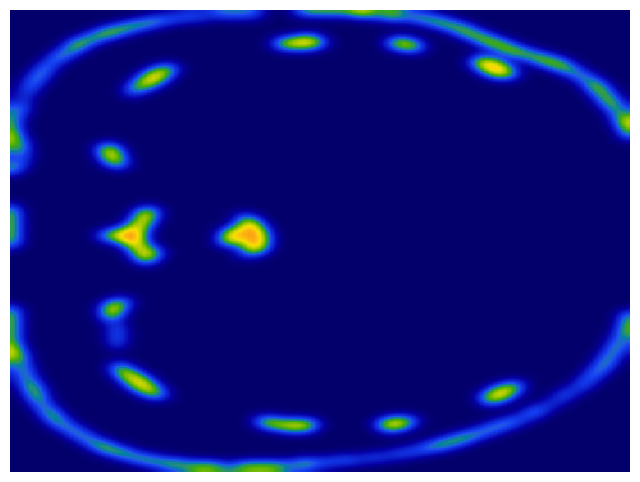

Noise ratio : 0.01
Frequency : 36
mu pearson correlation: nan

---------------    noise ratio : 0.1   -----------------

Evaluating FEM baseline
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.12s/it]
Image saved to ../Results/fem_abdomen_images/fem_het_preds_36_0.1.png


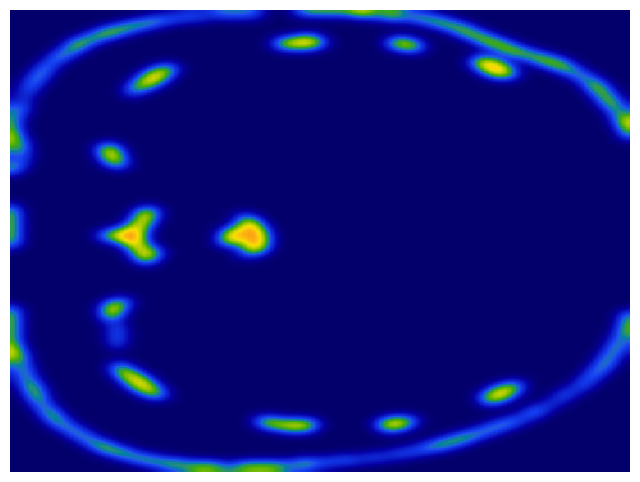

Noise ratio : 0.1
Frequency : 36
mu pearson correlation: nan


In [21]:
hetero=True
for noise in noise_ratios:
    print('\n---------------    noise ratio : {}   -----------------\n'.format(noise))
    example = return_new_example(f)
    example.add_gaussian_noise(noise)
    Baseline.mre_pinn.baseline.eval_fem_baseline(example, f, u_elem_type='CG-3',mu_elem_type='DG-1',savgol_filter=False,hetero=hetero)
    mu_pred = example['fem'].real.values
    mu = fem_abdomen_dict[f]['mu']
    z_fixed = 15 
    mu_pred = mu_pred.reshape(*coords_shape)
    mu_pred[mu>threshold]=threshold
    ex = fem_abdomen_dict[f]['example']
    visualize_overlay(np.minimum(mu.real, threshold), mu_pred, fixed_axis='z', fixed_index=5, vmax=threshold, vmin=0, alpha=1,blur_sigma=2, cmap_pred=cmap_palette)#, save_path=fem_abdomen_img_path+'fem_het_preds_{}_{}.png'.format(f, noise))
    print('Noise ratio : {}'.format(noise))
    print('Frequency : {}'.format(f))
    print('mu pearson correlation: {}'.format(compute_pearson(mu_pred, ex.mre, (mu<threshold)).values))